In [ ]:
import pandas as pd

In [ ]:
data = pd.read_pickle('Spectral_data')

UnpicklingError: ignored

In [ ]:
#Broadband power accross the whole thing
t_f = 50000
time_points = np.arange(7500, t_f)
plt.figure()
plt.plot(time_points, np.ma.average(V[7500:t_f], axis = 1))
plt.axhline(np.ma.average(V_tongue[:,42]), c='b',label='Mean from tongue signal')
plt.axhline(np.ma.average(V_hand[:, 20]), c='y' ,label='Mean from hand signal')
v_line = []
for i in dat1['t_on']:
  if i < t_f:
    v_line.append(i)
for i in v_line:
  plt.axvline(i, c='g')
  plt.axvline(i+3000, c='r')
plt.suptitle('Broadband power across time')
plt.legend()
plt.show()

NameError: ignored

## Loading of Miller ECoG data of motor imagery

includes some visualizations

In [ ]:
# @title Data retrieval
import os, requests

fname = 'motor_imagery.npz'
url = "https://osf.io/ksqv8/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [ ]:
# @title Install packages (`nilearn`, `nimare`. `duecredit`), import `matplotlib` and set defaults
# install packages to visualize brains and electrode locations
!pip install nilearn --quiet
!pip install nimare --quiet
!pip install duecredit --quiet

from matplotlib import rcParams
from matplotlib import pyplot as plt

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [ ]:
# @title Data loading
import numpy as np

alldat = np.load(fname, allow_pickle=True)['dat']

# select just one of the recordings here. 11 is nice because it has some neurons in vis ctx.
dat1 = alldat[0][0]
dat2 = alldat[0][1]

print(dat1.keys())
print(dat2.keys())

dict_keys(['t_off', 'stim_id', 't_on', 'srate', 'V', 'scale_uv', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
dict_keys(['t_off', 'stim_id', 't_on', 'srate', 'V', 'scale_uv', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


# Dataset info #

This is one of multiple ECoG datasets from Miller 2019, recorded in a clinical settings with a variety of tasks. Raw data and dataset paper are here:

https://exhibits.stanford.edu/data/catalog/zk881ps0522
https://www.nature.com/articles/s41562-019-0678-3

This particular dataset was originally described in this paper:

- Miller, Kai J., Gerwin Schalk, Eberhard E. Fetz, Marcel Den Nijs, Jeffrey G. Ojemann, and Rajesh PN Rao. "Cortical activity during motor execution, motor imagery, and imagery-based online feedback." Proceedings of the National Academy of Sciences (2010): 200913697. doi: [10.1073/pnas.0913697107](https://doi.org/10.1073/pnas.0913697107)

<br>

`dat1` and `dat2` are data from the two blocks performed in each subject. The first one was the actual movements, the second one was motor imagery. For the movement task, from the original dataset instructions:

*Patients performed simple, repetitive, motor tasks of hand (synchronous flexion and extension of all fingers, i.e., clenching and releasing a fist at a self-paced rate of ~1-2 Hz) or tongue (opening of mouth with protrusion and retraction of the tongue, i.e., sticking the tongue in and out, also at ~1-2 Hz). These movements were performed in an interval-based manner, alternating between movement and rest, and the side of move- ment was always contralateral to the side of cortical grid placement.*

<br>

For the imagery task, from the original dataset instructions:

*Following the overt movement experiment, each subject performed an imagery task, imagining making identical movement rather than executing the movement. The imagery was kinesthetic rather than visual (“imagine yourself performing the actions like you just did”; i.e., “don’t imagine what it looked like, but imagine making the motions”).*

<br>

Sample rate is always 1000Hz, and the ECoG data has been notch-filtered at 60, 120, 180, 240 and 250Hz, followed by z-scoring across time and conversion to float16 to minimize size. Please convert back to float32 after loading the data in the notebook, to avoid unexpected behavior.

Both experiments:
* `dat['V']`: continuous voltage data (time by channels)
* `dat['srate']`: acquisition rate (1000 Hz). All stimulus times are in units of this.  
* `dat['t_on']`: time of stimulus onset in data samples
* `dat['t_off']`: time of stimulus offset, always 400 samples after `t_on`
* `dat['stim_id`]: identity of stimulus (11 = tongue, 12 = hand), real or imaginary stimulus
* `dat['scale_uv']`: scale factor to multiply the data values to get to microvolts (uV).
* `dat['locs`]`: 3D electrode positions on the brain surface

In [ ]:
from nilearn import plotting
from nimare import utils

plt.figure(figsize=(8, 8))
locs = dat1['locs']
view = plotting.view_markers(utils.tal2mni(locs),
                             marker_labels=['%d'%k for k in np.arange(locs.shape[0])],
                             marker_color='purple',
                             marker_size=5)
view

<Figure size 800x800 with 0 Axes>

In [ ]:
# quick way to get broadband power in time-varying windows
from scipy import signal

# pick subject 0 and experiment 0 (real movements)
dat1 = alldat[0][0]

# V is the voltage data
V = dat1['V'].astype('float32')

# high-pass filter above 50 Hz
b, a = signal.butter(3, [50], btype='high', fs=1000)
V = signal.filtfilt(b, a, V, 0)

# compute smooth envelope of this signal = approx power
V = np.abs(V)**2
b, a = signal.butter(3, [10], btype='low', fs=1000)
V = signal.filtfilt(b, a, V, 0)

# normalize each channel so its mean power is 1
V = V/V.mean(0)

In [ ]:
# average the broadband power across all tongue and hand trials
nt, nchan = V.shape
nstim = len(dat1['t_on'])

trange = np.arange(0, 2000)
ts = dat1['t_on'][:, np.newaxis] + trange
V_epochs = np.reshape(V[ts, :], (nstim, 2000, nchan))

V_tongue = (V_epochs[dat1['stim_id'] == 11]).mean(0)
V_hand = (V_epochs[dat1['stim_id'] == 12]).mean(0)


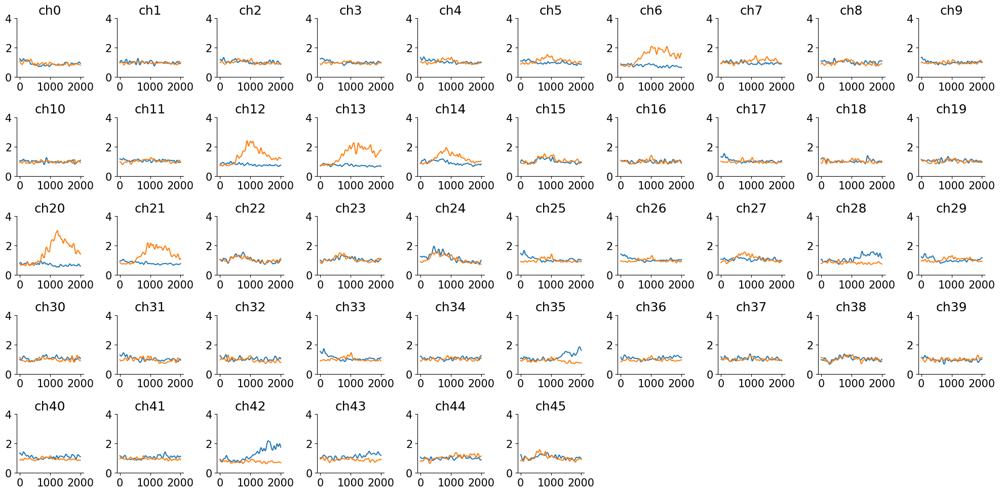

In [ ]:
# let's find the electrodes that distinguish tongue from hand movements
# note the behaviors happen some time after the visual cue

plt.figure(figsize=(20, 10))
for j in range(46):
  ax = plt.subplot(5, 10, j+1)
  plt.plot(trange, V_tongue[:, j])
  plt.plot(trange, V_hand[:, j])
  plt.title('ch%d'%j)
  plt.xticks([0, 1000, 2000])
  plt.ylim([0, 4])
plt.show()

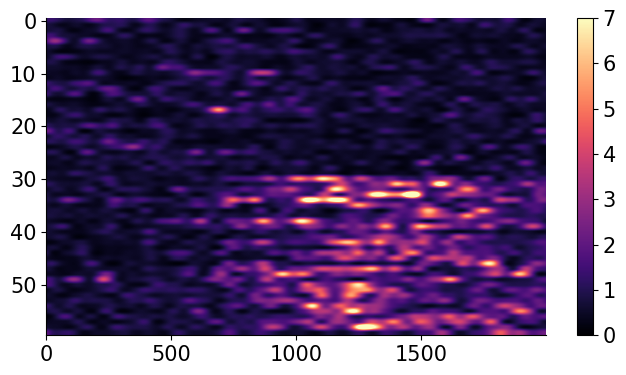

In [ ]:
# let's look at all the trials for electrode 20 that has a good response to hand movements
# we will sort trials by stimulus id
plt.subplot(1, 3, 1)
isort = np.argsort(dat1['stim_id'])
plt.imshow(V_epochs[isort, :, 20].astype('float32'),
           aspect='auto',
           vmax=7, vmin=0,
           cmap='magma')
plt.colorbar()
plt.show()

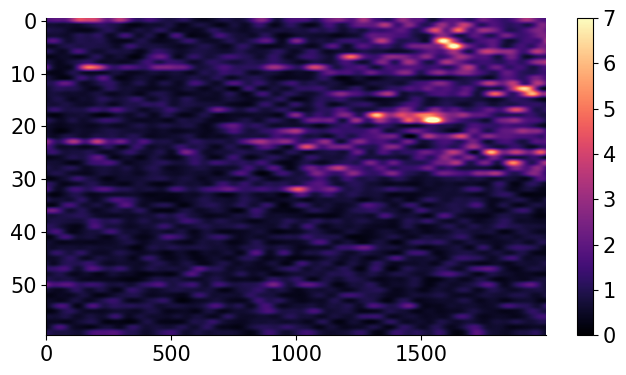

In [ ]:
# Electrode 42 seems to respond to tongue movements
isort = np.argsort(dat1['stim_id'])
plt.subplot(1, 3, 1)
plt.imshow(V_epochs[isort, :, 42].astype('float32'),
           aspect='auto',
           vmax=7, vmin=0,
           cmap='magma')
plt.colorbar()
plt.show()

**Nilearn, nimare and MNE exploration**

In [ ]:
!pip install mne --quiet
!pip install nilearn --quiet
!pip install nimare --quiet
!pip install duecredit --quiet

from matplotlib import rcParams
from matplotlib import pyplot as plt

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 18.7 MB/s eta 0:00:00


In [ ]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mne.viz import plot_alignment, snapshot_brain_montage

**MNE tutorials (from numpy to MNE data) for dat1**

In [ ]:
n_channels = 46
sampling_freq = 1000  # in Hertz
ch_names = [f"ECoG{n}" for n in range(1, 47)]
ch_types = ['ecog']*46
info = mne.create_info(sfreq=sampling_freq , ch_types=ch_types, ch_names=ch_names)

In [ ]:
from nimare import utils

mni_locs = utils.tal2mni(dat1['locs'])

In [ ]:
ch_pos = dict(zip(ch_names, mni_locs))

montage = mne.channels.make_dig_montage(
    ch_pos, coord_frame='mni_tal')

info.set_montage(montage)

<ipython-input-11-5a2aa853d1a4>:6: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  info.set_montage(montage)


<Info | 8 non-empty values
 bads: []
 ch_names: ECoG1, ECoG2, ECoG3, ECoG4, ECoG5, ECoG6, ECoG7, ECoG8, ECoG9, ...
 chs: 46 ECoG
 custom_ref_applied: False
 dig: 46 items (46 EEG)
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 46
 projs: []
 sfreq: 1000.0 Hz
>

In [ ]:
from scipy import signal

d1 = dat1['V'].astype('float32') #* dat1['scale_uv']
#d1 = dat2['V'].astype('float32') #* dat1['scale_uv']


# high-pass filter above 100 Hz
b, a = signal.butter(3, [100], btype='high', fs=1000)
d1 = signal.filtfilt(b, a, d1, 0)
d1 = d1.T

In [ ]:
#creating raw data from our data

sim_d1 = mne.io.RawArray(d1, info)

Creating RawArray with float64 data, n_channels=46, n_times=376400
    Range : 0 ... 376399 =      0.000 ...   376.399 secs
Ready.


In [ ]:
sim_d1.compute_psd()

Effective window size : 2.048 (s)


Data type,Power Spectrum
Units,ecog: V²/Hz
Data source,Raw
Dims,"channel, freq"
Estimation method,welch
Number of channels,46
Number of frequency bins,1025
Frequency range,0.00 – 500.00 Hz


In [ ]:
#creating events

events = []

for i , stim_id in enumerate(dat1['stim_id']):
  events.append([dat1['t_on'][i] ,  0 , stim_id])

event_id = dict(hand=12 , tongue=11)
events_np = np.array(events)

In [ ]:
sim_epochs = mne.Epochs(
    raw=sim_d1, tmin=-1.5, tmax=4, events=events_np, event_id=event_id
)

#sim_epochs.plot(picks='all', events=events_np, event_id=event_id)

Not setting metadata
60 matching events found
Setting baseline interval to [-1.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


In [ ]:
epoch_df = sim_epochs.to_data_frame()

Using data from preloaded Raw for 60 events and 5501 original time points ...


In [ ]:
#оставим вариант по эпохам слегка на будущее
#epoch_df[epoch_df['epoch'] == 0].transpose()

,0,1,2,3,4,5,6,7,8,9,...,5491,5492,5493,5494,5495,5496,5497,5498,5499,5500
time,-1.5,-1.499,-1.498,-1.497,-1.496,-1.495,-1.494,-1.493,-1.492,-1.491,...,3.991,3.992,3.993,3.994,3.995,3.996,3.997,3.998,3.999,4.0
condition,hand,hand,hand,hand,hand,hand,hand,hand,hand,hand,...,hand,hand,hand,hand,hand,hand,hand,hand,hand,hand
epoch,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ECoG1,165255.275834,29889.510095,17502.372201,-16974.961179,-84936.672881,-69886.818744,-13492.913433,17401.963388,-15701.209256,705.867381,...,-49503.80201,14210.270188,-26664.993824,44143.651314,-69484.086707,75282.137425,-29465.625349,-22714.671762,-16852.66315,59762.623522
ECoG2,113236.201934,17565.504901,-31457.644867,-78001.250404,-86595.255304,-8155.33019,100447.343637,44557.444589,-2855.464055,-55605.533548,...,-28251.817459,48051.290137,18852.452503,78436.8861,-51975.983577,16457.878389,-68036.853472,7546.974745,-29888.052609,83491.772021
ECoG3,40433.3223,8958.798319,60857.772127,30872.526248,-18222.288486,-64082.117103,-12735.066809,-14571.591616,-11582.815864,7618.332231,...,-56121.044467,29982.231887,12465.2516,51803.108298,-19228.214095,45698.114499,-63684.935528,-22331.46822,-40490.571801,40950.03495
ECoG4,59177.417858,-16694.095078,49707.131329,62978.173463,-4628.887623,-39553.134264,-12013.990779,-49235.693152,-58389.044809,-7275.516708,...,-39546.368797,24689.85773,-5414.5286,47167.867317,-68634.017281,76322.622069,-81514.036308,14171.015391,-34085.214516,31548.481097
ECoG5,83746.573303,14769.793955,42879.525185,30008.854266,-19235.993324,-70399.67744,-14507.994282,-58492.613662,-55152.161803,64862.014397,...,-81321.764351,95682.34411,-8065.168071,49276.801246,-71031.202201,92406.077112,-125614.6188,-3200.17327,-35872.006731,77178.950497
ECoG6,114757.269019,-41877.54719,29740.72163,-40455.872327,-45996.704602,-49919.308565,64386.728917,15149.003627,-38396.362542,8942.587309,...,-93805.12657,149812.81634,-14252.394096,59982.194709,-137022.530042,74872.017501,-122932.576641,42015.611334,-101057.684313,105119.461561
ECoG7,85219.388504,-68377.524898,53912.119348,21844.640948,11087.873774,-109928.280895,-79089.55167,-47354.441329,18232.618614,97508.492619,...,-100815.363546,-9643.932887,-66679.913125,118105.44055,552.962726,111760.589284,-115391.035374,-17815.682648,-82441.375736,87214.206688


In [ ]:
epoch_spec = sim_epochs.compute_psd()

Using data from preloaded Raw for 60 events and 5501 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows


In [ ]:
mean_ts = np.mean(epoch_df[], axis=1).reshape(-1,1)
mean_ts

TypeError: ignored

In [ ]:
#functions to compute features

def stat_area_features(x, Te=1.0):

    mean_ts = np.mean(x, axis=1).reshape(-1,1) # mean
    max_ts = np.amax(x, axis=1).reshape(-1,1) # max
    min_ts = np.amin(x, axis=1).reshape(-1,1) # min
    std_ts = np.std(x, axis=1).reshape(-1,1) # std
    skew_ts = st.skew(x, axis=1).reshape(-1,1) # skew
    kurtosis_ts = st.kurtosis(x, axis=1).reshape(-1,1) # kurtosis
    iqr_ts = st.iqr(x, axis=1).reshape(-1,1) # interquartile rante
    mad_ts = np.median(np.sort(abs(x - np.median(x, axis=1).reshape(-1,1)),
                               axis=1), axis=1).reshape(-1,1) # median absolute deviation
    area_ts = np.trapz(x, axis=1, dx=Te).reshape(-1,1) # area under curve
    sq_area_ts = np.trapz(x ** 2, axis=1, dx=Te).reshape(-1,1) # area under curve ** 2

    return np.concatenate((mean_ts,max_ts,min_ts,std_ts,skew_ts,kurtosis_ts,
                           iqr_ts,mad_ts,area_ts,sq_area_ts), axis=1)


feat_df = stat_area_features(epoch_df)
feat_df.head()

KeyboardInterrupt: ignored

Averaging across epochs...


<ipython-input-64-1c436f53e7c7>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  epoch_spec.plot()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


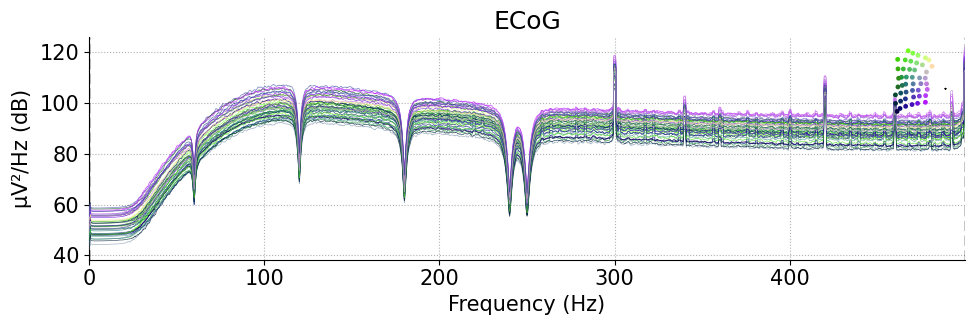

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


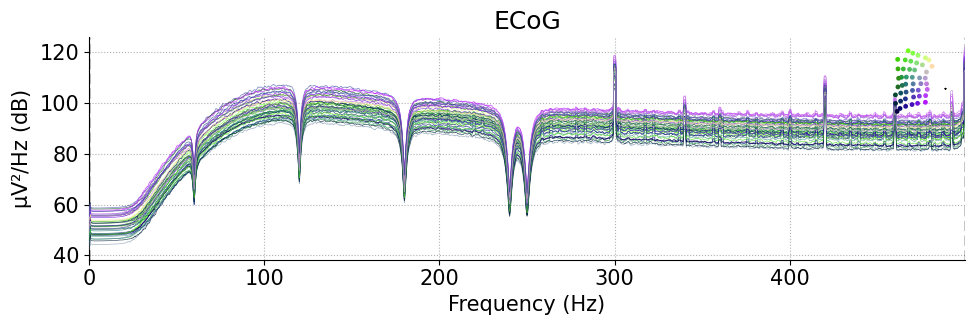

In [ ]:
epoch_spec.plot()

**From here we make PSD dataset**

In [ ]:
#how one dataset is made

df_real = epoch_spec.to_data_frame()
df_real['movement_type'] = np.array(['real']*len(df_real))

Creating RawArray with float64 data, n_channels=46, n_times=376600
    Range : 0 ... 376599 =      0.000 ...   376.599 secs
Ready.
Not setting metadata
60 matching events found
Setting baseline interval to [-1.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 60 events and 5501 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


<ipython-input-66-f3eec767ff28>:23: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  epoch_spec_2.plot()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


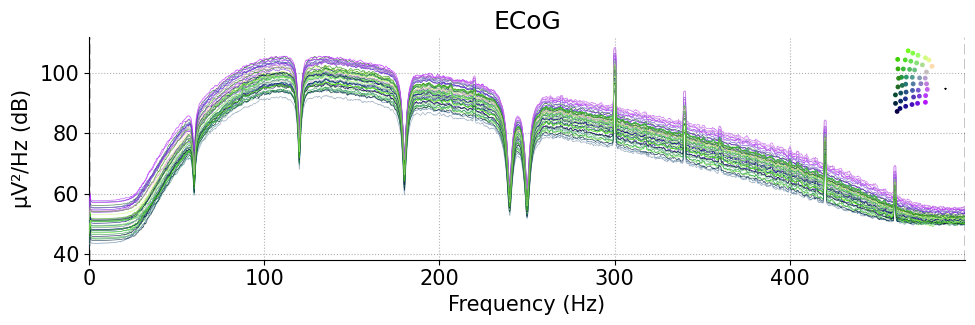

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


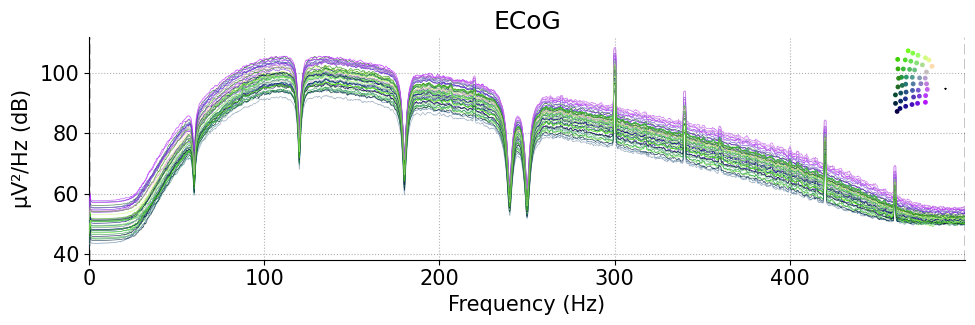

In [ ]:
#let's make the same shit but with imagery movements

from scipy import signal

d2 = dat2['V'].astype('float32') #* dat1['scale_uv']


# high-pass filter above 100 Hz
b, a = signal.butter(3, [100], btype='high', fs=1000)
d2 = signal.filtfilt(b, a, d2, 0)
d2 = d2.T

#creating raw data from our data

sim_d2 = mne.io.RawArray(d2, info)

sim_epochs_2 = mne.Epochs(
    raw=sim_d2, tmin=-1.5, tmax=4, events=events_np, event_id=event_id
)

epoch_spec_2 = sim_epochs_2.compute_psd()
epoch_spec_2.plot()

In [ ]:
#how one dataset is made

df_imagery = epoch_spec_2.to_data_frame()
df_imagery['movement_type'] = np.array(['imagery']*len(df_real))

In [ ]:
import pandas as pd

final_df = pd.concat([df_real, df_imagery], axis=0)

In [ ]:
final_df

,condition,epoch,freq,ECoG1,ECoG2,ECoG3,ECoG4,ECoG5,ECoG6,ECoG7,...,ECoG38,ECoG39,ECoG40,ECoG41,ECoG42,ECoG43,ECoG44,ECoG45,ECoG46,movement_type
0,hand,0,0.000000,4.612645e-07,1.049495e-07,8.984436e-08,1.500185e-07,2.504389e-07,1.963501e-08,1.374699e-09,...,1.113325e-08,7.310319e-07,5.007126e-08,1.676712e-07,6.482340e-08,4.945718e-07,9.343438e-09,1.469207e-08,1.652835e-08,real
1,hand,0,0.181785,9.282684e-07,2.112483e-07,1.804887e-07,3.016539e-07,5.037161e-07,3.935016e-08,2.760292e-09,...,2.227832e-08,1.471424e-06,1.007733e-07,3.375128e-07,1.300730e-07,9.954839e-07,1.869671e-08,2.954046e-08,3.327124e-08,real
2,hand,0,0.363570,9.488995e-07,2.160990e-07,1.833644e-07,3.074682e-07,5.139219e-07,3.963708e-08,2.799183e-09,...,2.232040e-08,1.505107e-06,1.030429e-07,3.453170e-07,1.316074e-07,1.018294e-06,1.873192e-08,3.010267e-08,3.404330e-08,real
3,hand,0,0.545355,1.003001e-06,2.288216e-07,1.909054e-07,3.227309e-07,5.407009e-07,4.038077e-08,2.901050e-09,...,2.242853e-08,1.593718e-06,1.090109e-07,3.657980e-07,1.356523e-07,1.078263e-06,1.882320e-08,3.158008e-08,3.607492e-08,real
4,hand,0,0.727141,1.243831e-06,2.854348e-07,2.244431e-07,3.915232e-07,6.604348e-07,4.314023e-08,3.530416e-09,...,2.286854e-08,2.006052e-06,1.365620e-07,4.578236e-07,1.551725e-07,1.354834e-06,1.916701e-08,3.841263e-08,4.562385e-08,real
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165055,tongue,59,499.181967,3.522394e-07,3.322680e-08,1.281913e-07,3.063887e-07,2.697953e-07,1.739870e-07,7.475826e-08,...,2.349922e-07,2.597811e-07,9.633535e-08,1.115080e-07,3.993021e-07,1.584993e-07,2.902796e-07,9.351263e-08,1.079301e-07,imagery
165056,tongue,59,499.363752,3.688656e-07,3.274739e-08,9.854619e-08,2.531456e-07,1.910914e-07,2.979790e-07,6.501420e-08,...,2.395753e-07,2.509207e-07,1.375405e-07,1.519344e-07,4.294458e-07,1.198425e-07,2.890863e-07,7.335167e-08,1.000616e-07,imagery
165057,tongue,59,499.545537,2.920030e-07,3.378759e-08,6.704515e-08,2.414132e-07,1.510478e-07,2.452550e-07,7.510323e-08,...,2.274069e-07,2.302071e-07,1.418570e-07,1.881588e-07,3.226311e-07,5.915488e-08,2.721242e-07,7.393300e-08,1.003343e-07,imagery
165058,tongue,59,499.727322,2.964675e-07,5.622340e-08,4.550769e-08,3.226166e-07,1.570374e-07,3.022391e-07,4.940896e-08,...,2.427112e-07,1.855529e-07,1.386715e-07,1.915245e-07,3.109906e-07,8.933978e-08,1.258442e-07,6.503465e-08,1.071281e-07,imagery


In [ ]:
final_df.to_pickle('fin.pickle')

In [ ]:
#mne.viz.plot_epochs(sim_epochs, picks='ECoG1', events = events_np)

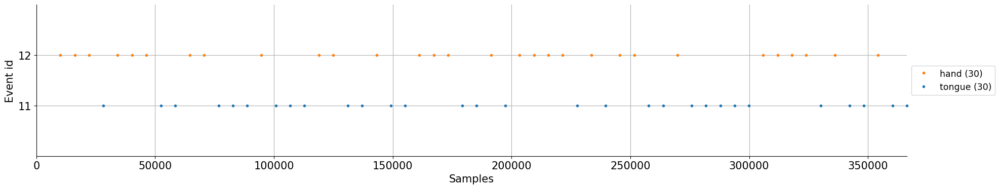

In [ ]:
mne.viz.plot_events(events_np,event_id=event_id);

<Evoked | 'simulated' (average, N=60), -1.5 – 374.9 s, baseline off, 46 ch, ~132.2 MB>


/usr/local/lib/python3.10/dist-packages/mne/viz/evoked.py:577: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.draw()  # for axes plots update axes.
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


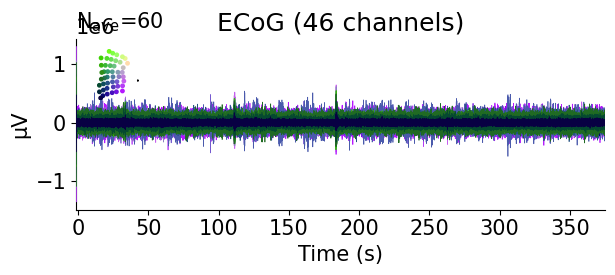

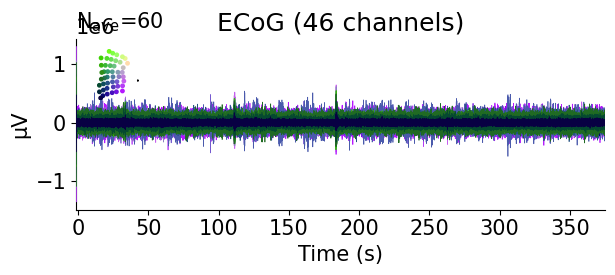

In [ ]:
#creating evoked

evoked_array = mne.EvokedArray(
    d1, info, tmin=-1.5, nave=60, comment="simulated"
)
print(evoked_array)
evoked_array.plot()

In [ ]:
#now let's move to ecog tutorial

sim_d1.load_data()

<RawArray | 46 x 376400 (376.4 s), ~132.2 MB, data loaded>

In [ ]:
#Think this is useless, 60hz has already been notch filtered ~ O
#sim_d1.notch_filter([60], trans_bandwidth=3)


In [ ]:
event_id

{'hand': 12, 'tongue': 11}

In [ ]:
evoked_new = sim_epochs.average().resample(200)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [ ]:
evoked_new

<Evoked | '0.50 × hand + 0.50 × tongue' (average, N=60), -1.5 – 3.995 s, baseline -1.5 – 0 s, 46 ch, ~461 kB>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 2.048 (s)


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


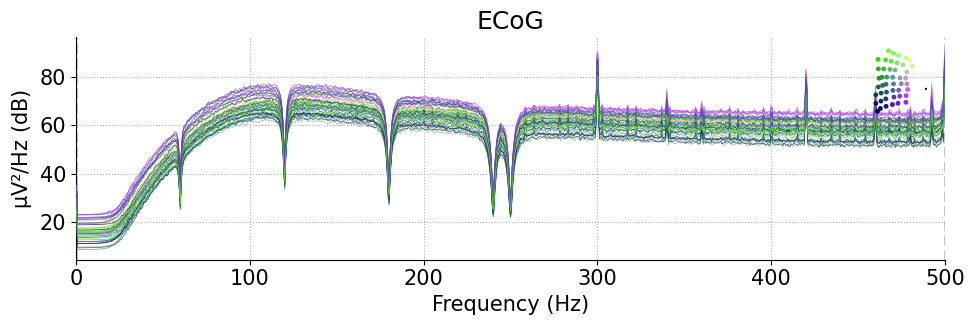

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


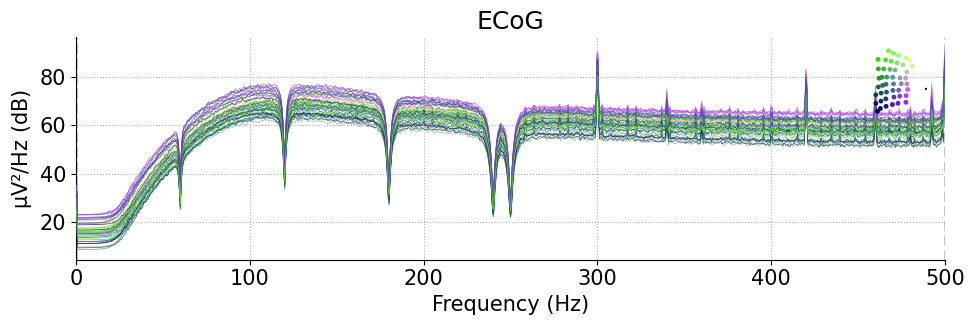

In [ ]:
#here we finished the ECoG tutorial, let's try some eeg tutorials

sim_d1.plot_psd(fmax=500)

Using data from preloaded Raw for 30 events and 5501 original time points ...
0 bad epochs dropped
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.10/dist-packages/mne/viz/epochs.py:403: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  this_axes_dict["evoked"].figure.canvas.draw_idle()
/usr/local/lib/python3.10/dist-packages/mne/viz/epochs.py:403: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  this_axes_dict["evoked"].figure.canvas.draw_idle()
/usr/local/lib/python3.10/dist-packages/mne/viz/epochs.py:403: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  this_axes_dict["evoked"].figure.canvas.draw_idle()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


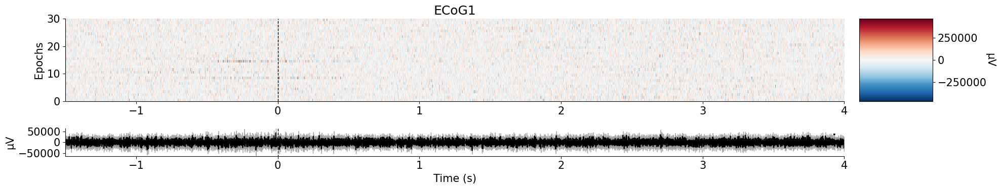

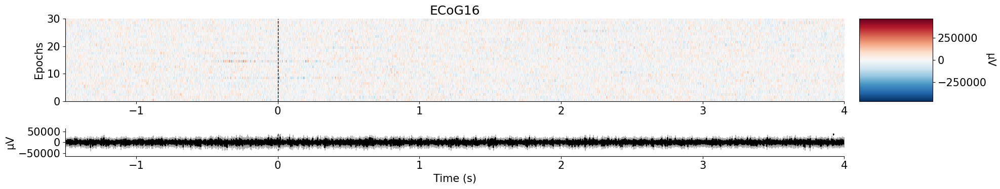

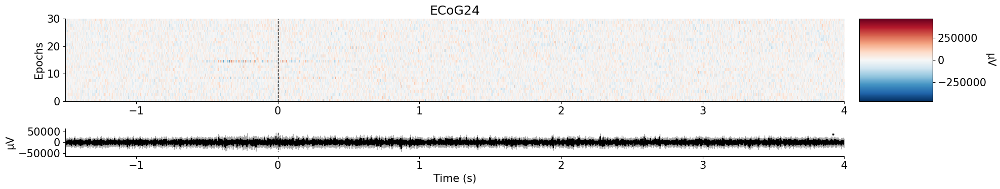

[<Figure size 2000x400 with 4 Axes>,
 <Figure size 2000x400 with 4 Axes>,
 <Figure size 2000x400 with 4 Axes>]

In [ ]:
sim_epochs['tongue'].plot_image(picks=['ECoG1', 'ECoG16', 'ECoG24'])

Using data from preloaded Raw for 30 events and 5501 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.6s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


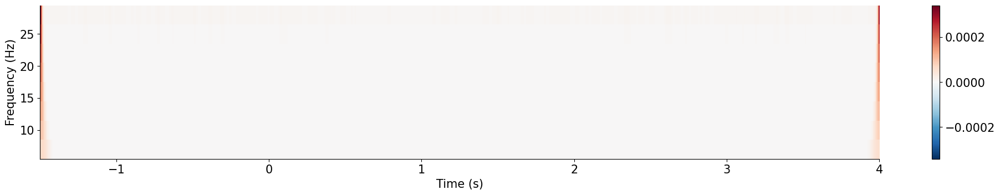

[<Figure size 2000x400 with 2 Axes>]

In [ ]:
frequencies = np.arange(7, 30, 3)
power = mne.time_frequency.tfr_morlet(sim_epochs['tongue'], n_cycles=2, return_itc=False,
                                      freqs=frequencies, decim=3)
power.plot(['ECoG1'])

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "gfp"
combining channels using "gfp"


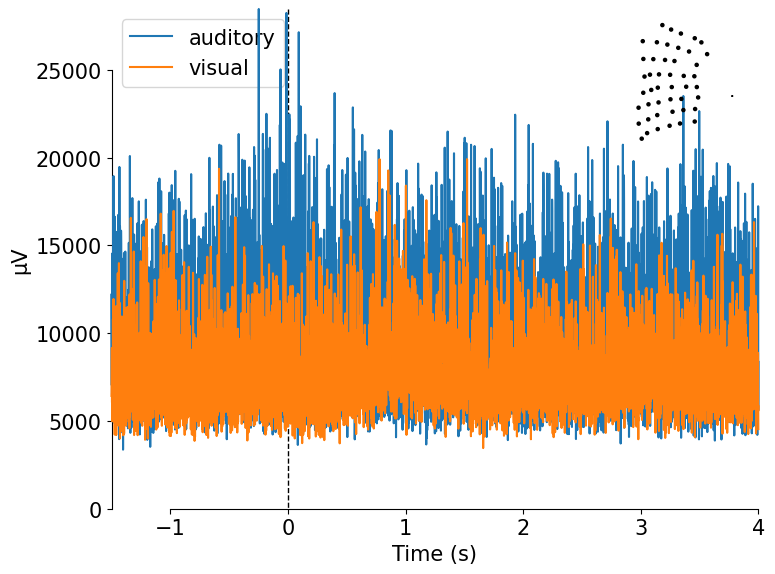

[<Figure size 800x600 with 2 Axes>]

In [ ]:
aud_evoked = sim_epochs['tongue'].average()
vis_evoked = sim_epochs['hand'].average()

mne.viz.plot_compare_evokeds(dict(auditory=aud_evoked, visual=vis_evoked),
                             legend='upper left', show_sensors='upper right')

/usr/local/lib/python3.10/dist-packages/mne/viz/evoked.py:577: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.draw()  # for axes plots update axes.


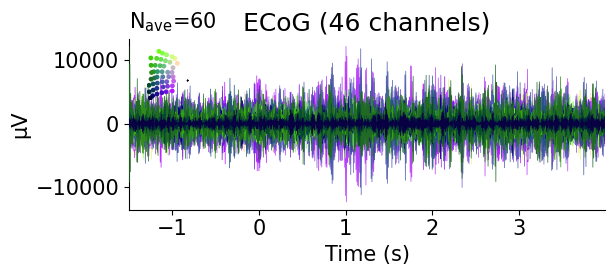

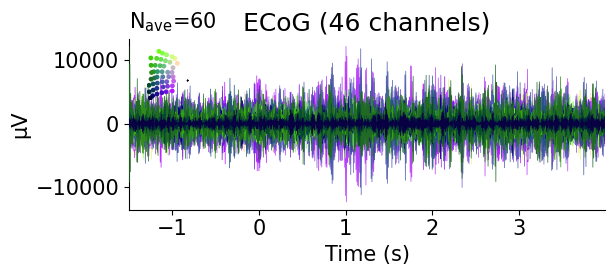

In [ ]:
evoked_new.plot()

In [ ]:
#lets to some ERD

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import pandas as pd
import seaborn as sns
import mne
from mne.datasets import eegbci
from mne.io import concatenate_raws, read_raw_edf
from mne.time_frequency import tfr_multitaper
from mne.stats import permutation_cluster_1samp_test as pcluster_test


In [ ]:
freqs = np.arange(2, 36)  # frequencies from 2-35Hz
vmin, vmax = -1.5, 4  # set min and max ERDS values in plot
baseline = (-1.5, 0)  # baseline interval (in s)
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS

kwargs = dict(
    n_permutations=100, step_down_p=0.05, seed=1, buffer_size=None, out_type="mask"
)  # for cluster test

tmin, tmax = -1.5, 4


Using data from preloaded Raw for 60 events and 5501 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:   32.0s


Not setting metadata
Applying baseline correction (mode: percent)
Using a threshold of 1.699127
stat_fun(H1): min=-20.756171 max=7.715317
Running initial clustering …
Found 24 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-20.756171 max=7.715317
Running initial clustering …
Found 378 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.699127
stat_fun(H1): min=-18.326970 max=6.475549
Running initial clustering …
Found 37 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-18.326970 max=6.475549
Running initial clustering …
Found 847 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.699127
stat_fun(H1): min=-17.542683 max=6.496591
Running initial clustering …
Found 28 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-17.542683 max=6.496591
Running initial clustering …
Found 797 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.699127
stat_fun(H1): min=-18.228389 max=7.736131
Running initial clustering …
Found 38 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-18.228389 max=7.736131
Running initial clustering …
Found 732 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 3 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.699127
stat_fun(H1): min=-16.617215 max=8.256712
Running initial clustering …
Found 26 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-16.617215 max=8.256712
Running initial clustering …
Found 847 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied
Using a threshold of 1.699127
stat_fun(H1): min=-15.818320 max=6.340119
Running initial clustering …
Found 35 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.699127
stat_fun(H1): min=-15.818320 max=6.340119
Running initial clustering …
Found 840 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No baseline correction applied


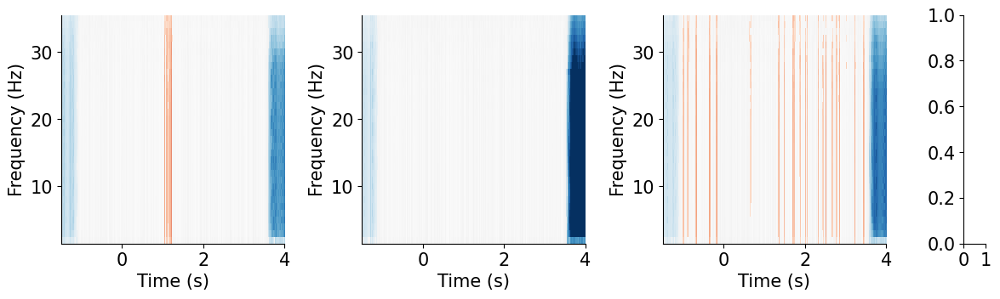

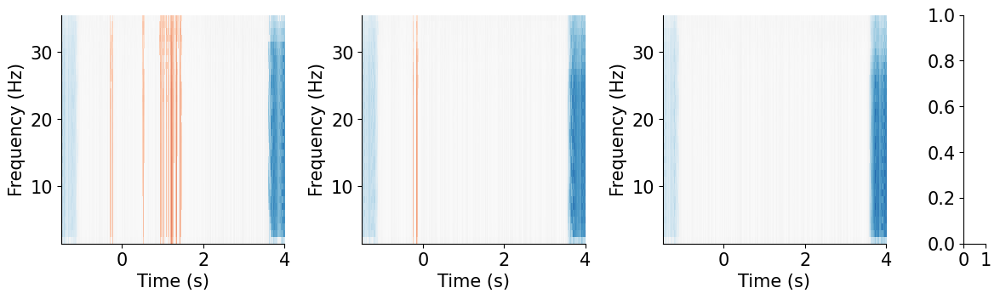

In [ ]:
tfr = tfr_multitaper(
    sim_epochs,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)
tfr.crop(tmin, tmax).apply_baseline(baseline, mode="percent")

for event in event_id:
    # select desired epochs for visualization
    tfr_ev = tfr[event]
    fig, axes = plt.subplots(
        1, 4, figsize=(12, 4), gridspec_kw={"width_ratios": [10, 10, 10, 1]}
    )
    for ch, ax in enumerate(axes[:-1]):  # for each channel
        # positive clusters
        _, c1, p1, _ = pcluster_test(tfr_ev.data[:, ch], tail=1, **kwargs)
        # negative clusters
        _, c2, p2, _ = pcluster_test(tfr_ev.data[:, ch], tail=-1, **kwargs)

        # note that we keep clusters with p <= 0.05 from the combined clusters
        # of two independent tests; in this example, we do not correct for
        # these two comparisons
        c = np.stack(c1 + c2, axis=2)  # combined clusters
        p = np.concatenate((p1, p2))  # combined p-values
        mask = c[..., p <= 0.05].any(axis=-1)

        # plot TFR (ERDS map with masking)
        tfr_ev.average().plot(
            [ch],
            cmap="RdBu",
            cnorm=cnorm,
            axes=ax,
            colorbar=False,
            show=False,
            mask=mask,
            mask_style="mask",
        )

        #ax.set_title(sim_epochs.ch_names[ch], fontsize=10)
        #ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        #if ch != 0:
            #ax.set_ylabel("")
            #ax.set_yticklabels("")
    #fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    #fig.suptitle(f"ERDS ({event})")
    #plt.show()

In [ ]:
new_tfr = tfr.pick_channels(['ECoG1', 'ECoG2', 'ECoG3'])

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [ ]:
df = new_tfr.to_data_frame(time_format=None, long_format=True)
df.shape

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


(16836120, 7)

In [ ]:
# Map to frequency bands:
freq_bounds = {"delta": 3, "theta": 7, "alpha": 13, "beta": 35, "gamma": 140}
df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)

In [ ]:
# Filter to retain only relevant frequency bands:
freq_bands_of_interest = ["theta", "alpha", "beta", 'gamma']
df = df[df.band.isin(freq_bands_of_interest)]
df["band"] = df["band"].cat.remove_unused_categories()

In [ ]:
# Order channels for plotting:
df["channel"] = df["channel"].cat.reorder_categories(("ECoG1", "ECoG2", "ECoG3"), ordered=True)

In [ ]:
df.head()

,condition,epoch,freq,time,channel,ch_type,value,band
16506,hand,0,4.0,-1.500,ECoG1,ecog,1.927261,theta
16507,hand,0,4.0,-1.500,ECoG2,ecog,0.048318,theta
16508,hand,0,4.0,-1.500,ECoG3,ecog,2.369048,theta
16509,hand,0,4.0,-1.498,ECoG1,ecog,2.402133,theta
16510,hand,0,4.0,-1.498,ECoG2,ecog,1.751751,theta


In [ ]:
g = sns.FacetGrid(df, row="band", col="channel", margin_titles=True)
g.map(sns.lineplot, "time", "value", "condition", n_boot=10)
axline_kw = dict(color="black", linestyle="dashed", linewidth=0.5, alpha=0.5)
g.map(plt.axhline, y=0, **axline_kw)
g.map(plt.axvline, x=0, **axline_kw)
g.set(ylim=(None, 1.5))
g.set_axis_labels("Time (s)", "ERDS (%)")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.add_legend(ncol=2, loc="lower center")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.08)

In [ ]:
df_mean = (
    df.query("time > 1")
    .groupby(["condition", "epoch", "band", "channel"])[["value"]]
    .mean()
    .reset_index()
)

g = sns.FacetGrid(
    df_mean, col="condition", col_order=["hand", "tongue"], margin_titles=True
)
g = g.map(
    sns.violinplot,
    "channel",
    "value",
    "band",
    n_boot=10,
    palette="deep",
    order=["ECoG1", "ECoG2", "ECoG3"],
    hue_order=freq_bands_of_interest,
    linewidth=0.5,
).add_legend(ncol=4, loc="lower center")

g.map(plt.axhline, **axline_kw)
g.set_axis_labels("", "ERDS (%)")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.3)

**Let's work with functional connectivity**

In [ ]:
pip install mne-connectivity

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 11.2 MB/s eta 0:00:00


In [ ]:
# Author: Martin Luessi <mluessi@nmr.mgh.harvard.edu>
#
# License: BSD (3-clause)

import numpy as np

import mne
from mne.datasets import sample
from mne.minimum_norm import (apply_inverse, apply_inverse_epochs,
                              read_inverse_operator)
from mne_connectivity import seed_target_indices, spectral_connectivity_epochs

print(__doc__)

Automatically created module for IPython interactive environment


In [ ]:
mne.read_source_spaces(fname=sample)

OSError: ignored

In [ ]:
mne.make_forward_solution(info, trans='fsaverage', src=, bem=)

SyntaxError: ignored

In [ ]:
method = "dSPM"  # use dSPM method (could also be MNE or sLORETA)

# Load data.
mne.minimum_norm.make_inverse_operator(info, forward=, noise_cov=)

# ECoG analyses

**visualize voltage traces**

In [ ]:
dat1.keys()

In [ ]:
#voltage

#voltage data: time x channels
V_1 = dat1['V']
n_t1, n_ch1 = V_1.shape
channels = np.arange(n_ch1)

#time
t_all = np.arange(n_t1)
t_on = dat1['t_on']
t_off = dat1['t_off']

#stimulus

n_stim = len(t_on)
stim_id = dat1['stim_id']


In [ ]:
#TO DO: make events color based on the type of events

#plot one channel

def plot_one_channel(i_ch=42, t_min_show=0, t_max_show=376399): #you can change channel here
    fig = plt.figure(figsize=(20, 3))
    ax = fig.subplots(1, 1)

        # Choose time window
    if t_min_show is None:
        t_min_show = t_all[0]
    if t_max_show is None:
        t_max_show = t_all[-1]
    mask = (t_all >= t_min_show) * (t_all < t_max_show)
    mask_oo = (t_on >= t_min_show) * (t_off < t_max_show)

    ax.plot(t_all[mask], V_1[mask][:, i_ch], alpha=0.8, label="$V_{\mathrm{ch}\,%d}$" %(i_ch))

    # Add stimulus on-off
    for i_t, (t_on_i, t_off_i) in enumerate(
        zip(t_on[mask_oo], t_off[mask_oo])):
        t_oo = np.array([t_on_i, t_off_i])
        ax.plot(t_oo, np.zeros_like(t_oo),
                label="Stim on" if i_t==0 else None)
    ax.legend(loc=3)
    ax.set_xticklabels((ax.get_xticks()*1e-3))
    ax.set_xlabel('Time $t$ / s')
    ax.set_ylabel('Ch %d: $V$' % i_ch)

plot_one_channel(i_ch=0, t_max_show=None)
plot_one_channel(i_ch=15)
plot_one_channel(i_ch=42)

In [ ]:
#the task duration is the same on both imagery and real movements
task1 = dat1['t_off'] - dat1['t_on']
task2 = dat2['t_off'] - dat2['t_on']

task1 == task2

In [ ]:
#but the order is not the same

dat1['stim_id'] == dat2['stim_id']

In [ ]:
V_2 = dat2['V']

In [ ]:
#let's make some means for real and imaginary movements


from scipy import signal

channel_ID = 43

trange = np.arange(-1500, 4500)
result_array_real = np.zeros((60, 6000, 1))
result_array_imaginary = np.zeros((60, 6000, 1))


for i in range(nstim):
    onset_index = t_on[i]
    offset_index = t_off[i]

    start_index = onset_index - 1500
    end_index = offset_index + 1500

    voltage_range_real = V_1[:, channel_ID][start_index:end_index].reshape(-1, 1)
    result_array_real[i] = voltage_range_real

    voltage_range_imag = V_2[:, channel_ID][start_index:end_index].reshape(-1, 1)
    result_array_imaginary[i] = voltage_range_imag

tongue_real = np.where(dat1['stim_id'] == 11)
V_epochs_tongue_real = result_array_real[tongue_real, :][0]

hand_real = np.where(dat1['stim_id'] == 12)
V_epochs_hand_real = result_array_real[hand_real, :][0]

tongue_imaginary = np.where(dat2['stim_id'] == 11)
V_epochs_tongue_imaginary = result_array_imaginary[tongue_imaginary, :][0]

hand_imaginary = np.where(dat2['stim_id'] == 12)
V_epochs_hand_imaginary = result_array_imaginary[hand_imaginary, :][0]



# Split into houses and faces stimuli and find ERP.
V_hand_real = V_epochs_hand_real.mean(0)
V_tongue_real  = V_epochs_tongue_real.mean(0)
V_hand_imag = V_epochs_hand_imaginary.mean(0)
V_tongue_imag  = V_epochs_tongue_imaginary.mean(0)

plt.title('Raw signal time-locked by motion for channel '+str(channel_ID))
plt.plot(trange, V_hand_real, label='hand real')
plt.plot(trange, V_tongue_real, label='tongue real')
plt.plot(trange, V_hand_imag, label='hand imaginary')
plt.plot(trange, V_tongue_imag, label='tongue imaginary')
plt.axvspan(0,3000, color='0.5', alpha=0.25)
plt.xlabel('Time (ms)')
plt.legend()
plt.show()

#better have to separate plots

In [ ]:
#let's try to divide into rythms some of our data and see what we've got

# Filter into delta, theta, alpha, beta, and gamma bands
b, a = signal.butter(5, [4], btype = 'low', fs=1000)
V_house_delta = signal.filtfilt(b,a,V_hand_real,0)
V_face_delta = signal.filtfilt(b,a,V_tongue_real,0)

b, a = signal.butter(5, [4,8], btype = 'bandpass', fs=1000)
V_house_theta = signal.filtfilt(b,a,V_hand_real,0)
V_face_theta = signal.filtfilt(b,a,V_tongue_real,0)

b, a = signal.butter(5, [8,12], btype = 'bandpass', fs=1000)
V_house_alpha = signal.filtfilt(b,a,V_hand_real,0)
V_face_alpha = signal.filtfilt(b,a,V_tongue_real,0)

b, a = signal.butter(5, [12,30], btype = 'bandpass', fs=1000)
V_house_beta = signal.filtfilt(b,a,V_hand_real,0)
V_face_beta = signal.filtfilt(b,a,V_tongue_real,0)

b, a = signal.butter(5, [30], btype = 'high', fs=1000)
V_house_gamma = signal.filtfilt(b,a,V_hand_real,0)
V_face_gamma = signal.filtfilt(b,a,V_tongue_real,0)

print('ERP decomposed into delta, theta, alpha, beta, and gamma bands for channel '+str(channel_ID))

# Plot
plt.figure(figsize=(25, 5))
plt.subplot(1,5,1)
plt.title('Delta')
plt.plot(trange,V_house_delta,label='house')
plt.plot(trange,V_face_delta,label='face')
plt.axvspan(0,3000, color='0.5', alpha=0.25)
plt.xlabel('Time (ms)')
plt.subplot(1,5,2)
plt.title('Theta')
plt.plot(trange,V_house_theta)
plt.plot(trange,V_face_theta)
plt.axvspan(0,3000, color='0.5', alpha=0.25)
plt.xlabel('Time (ms)')
plt.subplot(1,5,3)
plt.title('Alpha')
plt.plot(trange,V_house_alpha)
plt.plot(trange,V_face_alpha)
plt.axvspan(0,3000, color='0.5', alpha=0.25)
plt.xlabel('Time (ms)')
plt.subplot(1,5,4)
plt.title('Beta')
plt.plot(trange,V_house_beta)
plt.plot(trange,V_face_beta)
plt.axvspan(0,3000, color='0.5', alpha=0.25)
plt.xlabel('Time (ms)')
plt.subplot(1,5,5)
plt.title('Gamma')
plt.plot(trange,V_house_gamma,label='house')
plt.plot(trange,V_face_gamma,label='face')
plt.axvspan(0,3000, color='0.5', alpha=0.25,label='stim')
plt.xlabel('Time (ms)')
plt.legend()
plt.show()

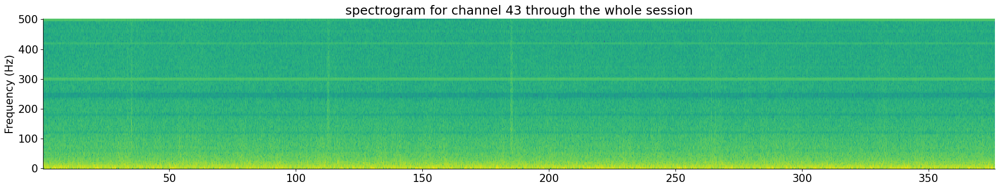

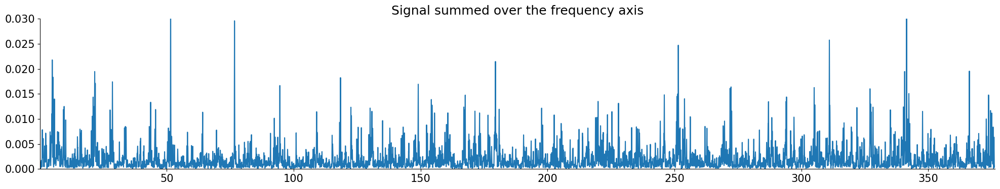

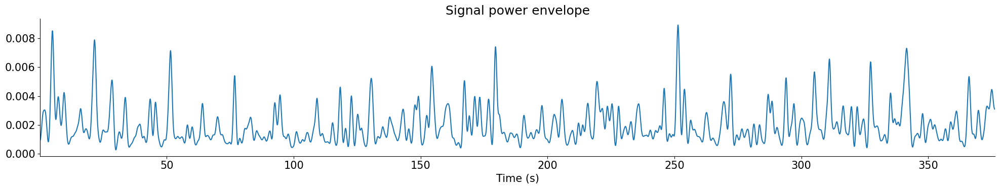

In [ ]:
#let's also try to replicate spectrogram

#plt.figure(figsize=(20, 6))
plt.title('spectrogram for channel 43 through the whole session')
Pxx, freqs, bins, im = plt.specgram(V_1[:,43],NFFT=2**8,noverlap=2**8-10,Fs=1000)
plt.pcolormesh(bins, freqs, 10*np.log10(Pxx))
plt.ylabel('Frequency (Hz)')
plt.show()

plt.title('Signal summed over the frequency axis')
summed_over_frequency_signal = Pxx.mean(0)
plt.plot(bins,summed_over_frequency_signal)
plt.xlim([min(bins),max(bins)])
plt.ylim([0,0.03])
plt.show()

plt.title('Signal power envelope')
b, a = signal.butter(3, [5], btype = 'low', fs=1000)
envelope = signal.filtfilt(b,a,summed_over_frequency_signal,0)
plt.plot(bins,envelope)
plt.xlabel('Time (s)')
plt.xlim([min(bins),max(bins)])
plt.show()

In [ ]:
dat1['t_on']

array([ 10160,  16160,  22160,  28240,  34240,  40320,  46360,  52440,
        58520,  64600,  70680,  76680,  82680,  88720,  94760, 100760,
       106800, 112840, 118880, 124960, 131040, 137080, 143160, 149160,
       155160, 161160, 167240, 173320, 179320, 185320, 191320, 197400,
       203400, 209480, 215520, 221520, 227560, 233600, 239640, 245640,
       251640, 257720, 263760, 269800, 275840, 281840, 287880, 293880,
       299880, 305920, 311920, 318000, 324000, 330080, 336120, 342200,
       348240, 354320, 360360, 366440])

In [ ]:
import random
import matplotlib.pyplot as plt

# Define the number of colors you want to generate
num_colors = 50

# Generate a list of random colors
random_colors = []
for _ in range(num_colors):
    random_color = "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
    random_colors.append(random_color)

colors = random_colors

In [ ]:
#colors = ['red', 'blue', 'green', 'black', 'yellow', 'purple', 'magenta', 'grey', 'orange', 'pink']

In [ ]:
dat1['t_on']

array([ 10160,  16160,  22160,  28240,  34240,  40320,  46360,  52440,
        58520,  64600,  70680,  76680,  82680,  88720,  94760, 100760,
       106800, 112840, 118880, 124960, 131040, 137080, 143160, 149160,
       155160, 161160, 167240, 173320, 179320, 185320, 191320, 197400,
       203400, 209480, 215520, 221520, 227560, 233600, 239640, 245640,
       251640, 257720, 263760, 269800, 275840, 281840, 287880, 293880,
       299880, 305920, 311920, 318000, 324000, 330080, 336120, 342200,
       348240, 354320, 360360, 366440])

In [ ]:
dat1['stim_id']

array([12, 12, 12, 11, 12, 12, 12, 11, 11, 12, 12, 11, 11, 11, 12, 11, 11,
       11, 12, 12, 11, 11, 12, 11, 11, 12, 12, 12, 11, 11, 12, 11, 12, 12,
       12, 12, 11, 12, 11, 12, 12, 11, 11, 12, 11, 11, 11, 11, 11, 12, 12,
       12, 12, 11, 12, 11, 11, 12, 11, 11], dtype=int32)

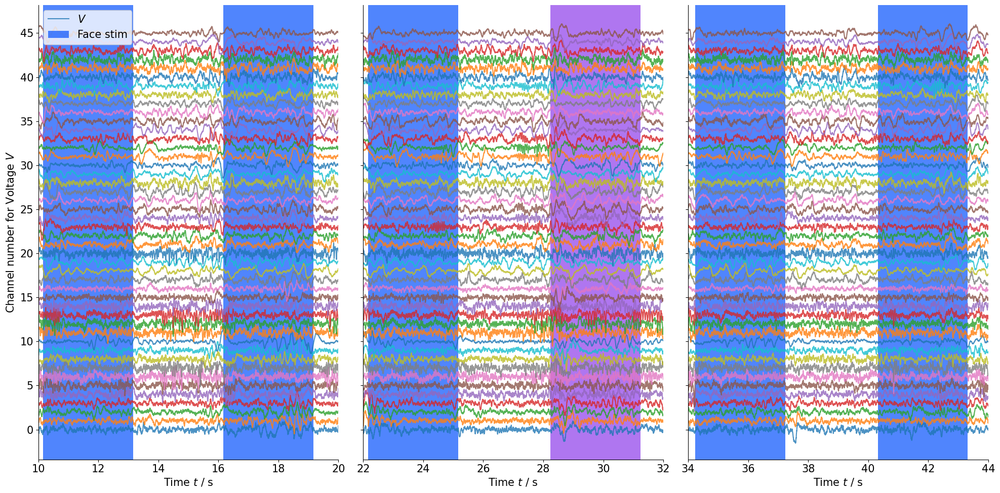

In [ ]:
#@title Plot all channels
def plot_time_windows(ch_clusters=None):
    """ Plot smaller time windows, but all channels.
    """
    # Define 3 time windows in ms
    t_min_shows = np.array([10000, 22000, 34000])      # create an array of three time windows and their start times; convert time to millisecond
    dt = 10000                                     # duration of each time window
    t_max_shows = t_min_shows + dt                    # create an array of three time windows and their end times
    n_t_show = len(t_min_shows)                       # this is the total number of time windows for the plot

    fig = plt.figure(figsize=(20, 10))
    n_cols = n_t_show
    axes = fig.subplots(1, n_t_show)                   # create 3 subplots in a 1 x n_t_show grid
    for i_c in range(n_t_show):
        ax = axes[i_c]
        # Choose time to be shown
        t_min_show = t_min_shows[i_c]
        t_max_show = t_max_shows[i_c]
        mask = (t_all >= t_min_show) * (t_all < t_max_show)     # mask indicates which data points are within the time window
        mask_oo = (t_on >= t_min_show) * (t_off < t_max_show)   # this indicates which data points are within the onset and offset windows

        # Show voltage traces
        offset = 3                                        # this is just the spacing between voltage traces in the plot
        if ch_clusters is None:                           # clustering is done in later cells (see below), so only voltage traces of all channels are plotted
            n_ch_show = n_ch1
            for i_ch in range(n_ch_show):
                ax.plot(t_all[mask], V_1[mask, i_ch] + i_ch * offset, alpha=0.8,
                        label="$V$" if i_ch==0 else None)
        else:
            # Sorted traces by clusters
            V_off = 0
            tickloc = []
            ticklbl = []
            for i_cl, ch_cluster in enumerate(ch_clusters):
                lbl_V = True
                c = colors[i_cl]
                for i_ch in ch_cluster:
                    lbl = r"$V_{\mathrm{Cluster %d}}$" % (i_cl) if lbl_V else None
                    lbl_V = False
                    ax.plot(t_all[mask], V_1[mask, i_ch] + V_off, c=c, alpha=0.8,
                            label=lbl)
                    tickloc.append(V_off)
                    ticklbl.append(i_ch)

                    V_off += offset
                V_off += 2 * offset

        # Show stimuli.
        # For this, we shade the times when a stimulus is on. Use a color scheme
        # to identify the stimulus.
        lbl_h = True
        lbl_f = True
        for (t_on_i, t_off_i) in zip(t_on[mask_oo], t_off[mask_oo]):
            idx = np.where(dat1['t_on'] == t_on_i)[0][0]
            is_house = stim_id[idx] == 11
            # Color indicates stimulus id:
            if is_house:
                lbl = 'House stim' if lbl_h else None
                lbl_h = False
            else:
                lbl = 'Face stim' if lbl_f else None
                lbl_f = False

            if ch_clusters is None:
                hatch = None
                c = colors[1] if is_house else colors[2]
            else:
                c = '0.5'
                hatch = "///" if is_house else "\\"
            ax.axvspan(t_on_i, t_off_i, facecolor=c, hatch=hatch,
                       edgecolor='k', lw=0,
                       alpha=0.7, zorder=-1, label=lbl)

        # Some polishing
        if i_c == 0:
            ax.legend(loc=2)
        # y-axis
        if i_c == 0:
            ymin, ymax = ax.get_ylim()
        ax.set_ylim(ymin, ymax)
        if ch_clusters is None:
            ytl = np.arange(0, n_ch_show, 5)
            ax.set_yticks(ytl*offset)
            if i_c == 0:
                ax.set_yticklabels(ytl)
                ax.set_ylabel('Channel number for Voltage $V$')
            else:
                ax.set_yticklabels([])
        else:
            if i_c == 0:
                ax.set_ylabel('Clustered voltage channels')
                ax.set_yticks(tickloc)
                ax.set_yticklabels(ticklbl, fontsize=11)
            else:
                ax.set_yticklabels([])
        # x-axis
        ax.set_xlim(t_min_show, t_max_show)
        xticks = ax.get_xticks()
        ax.set_xticks(xticks)
        ax.set_xticklabels(np.int_(xticks*1e-3))
        ax.set_xlabel('Time $t$ / s')
plot_time_windows()


In [ ]:
len(V_1.T)

46

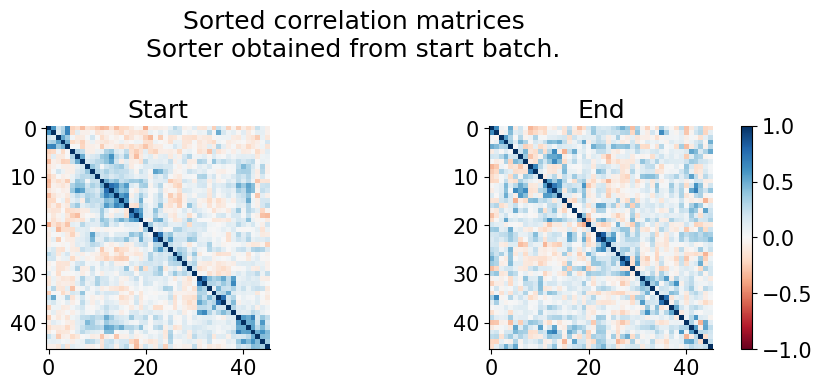

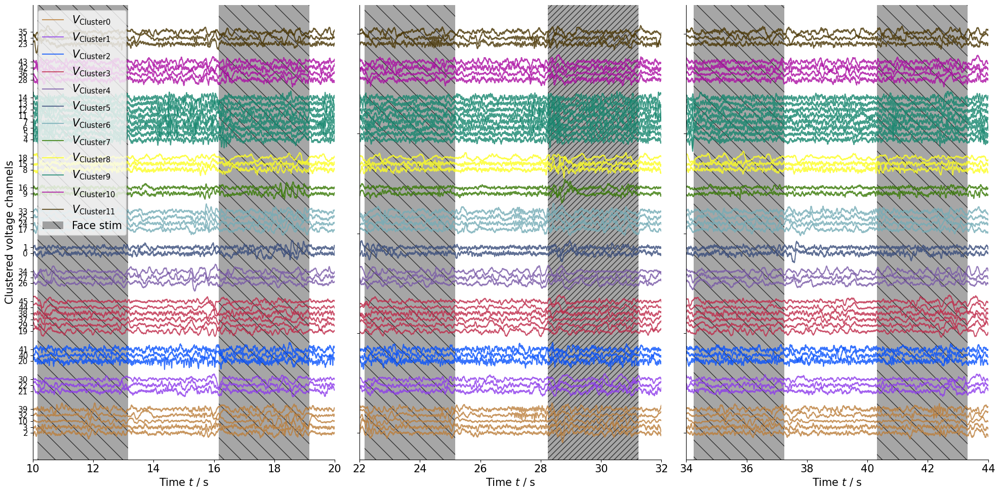

In [ ]:
#@title Cluster channels with cross correlation

# Subsampling for ease on memory?
step = 10         # this subsamples the data in a step size of 10

# Choose time window (restrict analysis to a specific time period)
dt = 3000
t_mins = np.array([t_on[0], t_off[-1]-dt])
t_maxs = t_mins + dt
n_cov = len(t_mins)
n_stim_g = len(V_1.T)

corr_all = np.zeros((n_cov, n_stim_g, n_stim_g))
for i_c in range(n_cov):                  # loop through time windows
    t_min = t_mins[i_c]                   # for each time window, get the start and end times
    t_max = t_maxs[i_c]
    mask = (t_all >= t_min) * (t_all < t_max)   # mask to indicate which data points are within the time window
    Vw = np.float_(V_1[mask][::step])             # data is subsampled using step=10
    Vw_sq = (Vw**2).sum(0)                      # calculate the variance of the data
    cov = (Vw[:, :, None] * Vw[:, None, :]).sum(0)      # calculate the covariance of the data. Covariance is a measure of how similar two signals are
    corr = cov / np.sqrt(Vw_sq[:, None] * Vw_sq[None, :])   # calculate the correlation. Correlation is covariance normalized by the variance of the signal
    corr_all[i_c] = corr                        # 2D array stores correlation data; time window x stim ID

# Cluster channels according to correlation
# Use the first matrix to cluster (first time window; training set); the second is for validation (second time window; test set)
# If the two matrices look similar, then the clustering is robust
corr = corr_all[0]

# Sort matrix by clusters.
# Based on: https://wil.yegelwel.com/cluster-correlation-matrix/
import scipy
import scipy.cluster.hierarchy as sch                 # this library has functions for hierarchical clustering
pairwise_distances = sch.distance.pdist(corr)         # the distance between two channels is a measure of how similar the channels are
linkage = sch.linkage(pairwise_distances, method='complete')      # linkage matrix is a hierarchical clustering of channels
cluster_distance_threshold = pairwise_distances.max()/2           # this threshold determines which channels belong in the same cluster
idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold,
                                    criterion='distance')         # this array indicates which cluster each channel belongs to
cl_sorter = np.argsort(idx_to_cluster_array)                      # channels are sorted according to cluster using cluster ID
# Obtain channel ids in each cluster
clusters = np.unique(idx_to_cluster_array)                        # loop through the unique cluster IDs
ch_clusters = []
for cl in clusters:                                               # for each cluster ID, get channel IDs that belong to each cluster
    cl_idx = np.where(idx_to_cluster_array == cl)[0]
    ch_clusters.append(channels[cl_idx])
n_cl = len(ch_clusters)                                           # 2D list (cluster ID, channel ID)

# Plot clustering
fig = plt.figure(figsize=(10, 4))
axes = fig.subplots(1, n_cov)
for i_c in range(n_cov):
    ax = axes[i_c]
    corr = corr_all[i_c]
    corr_s = corr[cl_sorter, :][:, cl_sorter]
    im = ax.imshow(corr_s, cmap="RdBu", vmin=-1, vmax=1)
    if i_c == n_cov-1:
        plt.colorbar(im)
    lbl = ["Start", "End"][i_c]
    ax.set_title(lbl)
fig.suptitle("Sorted correlation matrices\nSorter obtained from start batch.")

plot_time_windows(ch_clusters)

<ipython-input-66-49f6470ba164>:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels((ax.get_xticks()*1e-3))


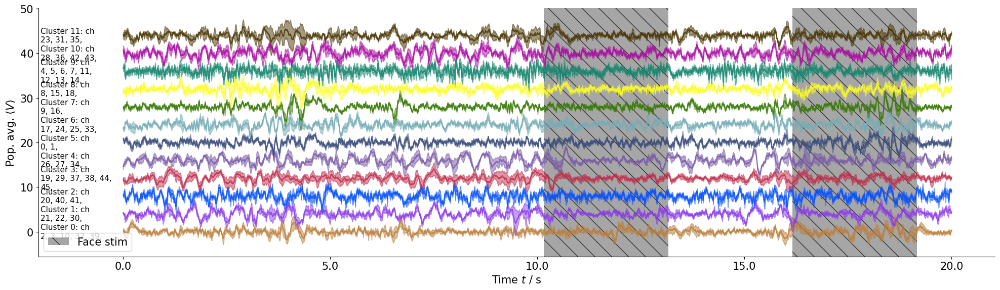

In [ ]:
#@title Plot cluster averages
def plot_pop_avg(t_min_show=0, t_max_show= 40 * 1e3, ch_clusters=None):
    if ch_clusters is None:
        fig = plt.figure(figsize=(20, 3))
    else:
        fig = plt.figure(figsize=(20, 6))
    ax = fig.subplots(1, 1)
    # Choose time window
    mask = (t_all >= t_min_show) * (t_all < t_max_show)
    mask_oo = (t_on >= t_min_show) * (t_off < t_max_show)

    if ch_clusters is None:
        V_cl = V[mask]
        V_clm = V_cl.mean(1)
        V_cls = V_cl.std(1)
        ax.plot(t_all[mask], V_clm, alpha=0.8,
                label=r"$\langle V\rangle$")
        ax.fill_between(t_all[mask], V_clm - V_cls, V_clm + V_cls,
                        alpha=0.5)
    else:
        # Sorted traces by clusters
        offset = 4
        for i_cl, ch_cluster in enumerate(ch_clusters):
            c = colors[i_cl]
            V_off = offset * i_cl
            V_cl = V_1[mask][:, ch_cluster] + V_off
            V_clm = V_cl.mean(1)
            V_cls = V_cl.std(1)
            ax.plot(t_all[mask], V_clm, c=c, alpha=0.8)
            ax.fill_between(t_all[mask], V_clm - V_cls, V_clm + V_cls,
                            color=c, alpha=0.5)
            # Indicate clusters
            lbl = "Cluster %d: ch\n" %i_cl
            for ii, i_ch in enumerate(ch_cluster):
                lbl += "%d, " % i_ch
                if ii %5 == 4: lbl += "\n"
            lbl = lbl[:-1]
            dt = (t_max_show - t_min_show)
            y = t_min_show - dt/10
            ax.text(y, V_off, lbl, ha='left', va='center', fontsize=11)
            ax.plot(t_min_show-dt/20, 0, '-')

    # Show stimuli.
    # For this, we shade the times when a stimulus is on. Use a color scheme
    # to identify the stimulus.
    lbl_h = True
    lbl_f = True
    for (t_on_i, t_off_i) in zip(t_on[mask_oo], t_off[mask_oo]):
        # Color indicates stimulus id:
        idx = np.where(dat1['t_on'] == t_on_i)[0][0]
        is_house = stim_id[idx] == 11
        if is_house:
            lbl = 'House stim' if lbl_h else None
            lbl_h = False
        else:
            lbl = 'Face stim' if lbl_f else None
            lbl_f = False

        if ch_clusters is None:
            hatch = None
            c = colors[1] if is_house else colors[2]
        else:
            c = '0.5'
            hatch = "///" if is_house else "\\"

        ax.axvspan(t_on_i, t_off_i, facecolor=c, hatch=hatch,
                   edgecolor='k', lw=0,
                   alpha=0.7, zorder=-1, label=lbl)

    ax.legend(loc=3)
    ax.set_xticklabels((ax.get_xticks()*1e-3))
    ax.set_xlabel('Time $t$ / s')
    ax.set_ylabel(r'Pop. avg. $\langle V \rangle$')

plot_pop_avg(0, 20e3, ch_clusters=ch_clusters)

Text(0.5, 0.98, 'PCA results for clusters (with # channels)\nIn a nutshell: signals are not low-D')

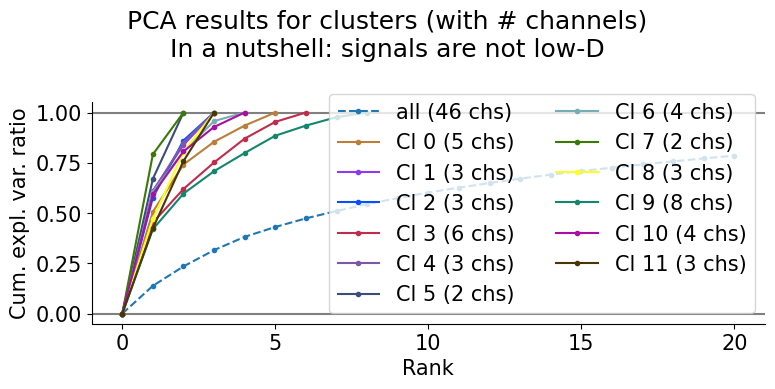

In [ ]:
#@title PCA per cluster (not very informative)
from sklearn.decomposition import PCA
# Full PCA
n_comp = 20
pca = PCA(n_comp)
pca.fit(V_1)
cevr_V = pca.explained_variance_ratio_.cumsum()
cevr_V = np.r_[0, cevr_V]
rank = np.arange(len(cevr_V))

# PCA for each cluster
cevr_cl = np.zeros((n_cl, ), dtype=object)
for i_cl in range(n_cl):
    ch_cl = ch_clusters[i_cl]
    V_cl = V_1[:, ch_cl]
    n_comp_cl = min(n_comp, len(ch_cl))
    pca = PCA(n_comp_cl)
    pca.fit(V_cl)
    cevr_cl_i = pca.explained_variance_ratio_.cumsum()
    cevr_cl[i_cl] = np.r_[0, cevr_cl_i]

# Plot
fig = plt.figure(figsize=(8, 4))
ax = fig.subplots(1, 1)
ax.plot(cevr_V, '.--', label="all (%d chs)" %(n_ch1))
for i_cl in range(n_cl):
    c = colors[i_cl]
    n_ch_cl = len(ch_clusters[i_cl])
    ax.plot(cevr_cl[i_cl], '.-', c=c, label="Cl %d (%d chs)" % (i_cl, n_ch_cl))
ax.legend(loc=4, ncol=2)
ax.set_xticks(rank[::5])
ax.set_xlabel("Rank")
ax.set_ylabel("Cum. expl. var. ratio")
ax.axhline(0, c='0.5', zorder=-1)
ax.axhline(1, c='0.5', zorder=-1)
fig.suptitle("PCA results for clusters (with # channels)\nIn a nutshell: signals are not low-D")

**Let's make something fun with connectivity analysis**

In [ ]:
sim_d1.del_proj()

<RawArray | 46 x 376400 (376.4 s), ~132.2 MB, data loaded>

In [ ]:
info.set_montage(new_montage)

<ipython-input-25-ff3fa418bcab>:1: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  info.set_montage(montage)


<Info | 8 non-empty values
 bads: []
 ch_names: ECoG1, ECoG2, ECoG3, ECoG4, ECoG5, ECoG6, ECoG7, ECoG8, ECoG9, ...
 chs: 46 ECoG
 custom_ref_applied: False
 dig: 46 items (46 EEG)
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 46
 projs: []
 sfreq: 1000.0 Hz
>

In [ ]:
sim_d1 = mne.io.RawArray(d1, info)

Creating RawArray with float64 data, n_channels=46, n_times=376400
    Range : 0 ... 376399 =      0.000 ...   376.399 secs
Ready.


In [ ]:
subject_dir = '/content/'

In [ ]:
data_path = mne.datasets.sample.data_path()
subjects_dir = data_path / "subjects"
bem_dir = subjects_dir / "sample" / "bem"
surf_dir = subjects_dir / "sample" / "surf"

In [ ]:
data_path

PosixPath('/root/mne_data/MNE-sample-data')

In [ ]:
dict_bem = mne.read_surface(bem_dir / "inner_skull.surf", return_dict=True)
fl = bem_dir / 'sample-head.fif'

In [ ]:
src = mne.setup_volume_source_space(pos=15.0, surface=dict_bem[2])

Boundary surface file : dict()
grid                  : 15.0 mm
mindist               : 5.0 mm

Loaded bounding surface from {'rr': array([[  0.6128    ,  -7.98400021, 103.73200226],
       [ 56.87490082,  -8.90219975,  73.78900146],
       [ 23.54640007,  57.43840027,  82.96379852],
       ...,
       [  7.27199984,   3.3750999 , -26.85230064],
       [  1.74430001,   6.1638999 , -26.84880066],
       [  3.87750006,   3.90400004, -32.71160126]]), 'tris': array([[   0,  644,  642],
       [ 642,  643,  162],
       [ 644,  643,  642],
       ...,
       [2561, 2201,  557],
       [2477, 2201, 2561],
       [2477,   11, 2201]], dtype=int32), 'ntri': 5120, 'use_tris': array([[   0,  644,  642],
       [ 642,  643,  162],
       [ 644,  643,  642],
       ...,
       [2561, 2201,  557],
       [2477, 2201, 2561],
       [2477,   11, 2201]], dtype=int32), 'np': 2562, 'tri_area': array([ 3.75548179,  5.71853922,  5.18808481, ..., 19.3440154 ,
       20.18883581, 17.89199523]), 'tri_cent': ar

In [ ]:
import os.path as op

fs_dir = mne.datasets.fetch_fsaverage(verbose=True)
bem = op.join(fs_dir, "bem", "fsaverage-5120-5120-5120-bem-sol.fif")


0 files missing from root.txt in /root/mne_data/MNE-fsaverage-data
0 files missing from bem.txt in /root/mne_data/MNE-fsaverage-data/fsaverage


In [ ]:
forward = mne.make_forward_solution(sim_d1.info, trans=None, src=src, bem=bem
                                    )

Source space          : <SourceSpaces: [<discrete, n_used=392>] MRI (surface RAS) coords, ~438 kB>
MRI -> head transform : identity
Measurement data      : instance of Info
Conductor model   : /root/mne_data/MNE-fsaverage-data/fsaverage/bem/fsaverage-5120-5120-5120-bem-sol.fif
Accurate field computations
Do computations in head coordinates
Free source orientations

Read 1 source spaces a total of 392 active source locations

Coordinate transformation: MRI (surface RAS) -> head
     1.000000  0.000000  0.000000       0.00 mm
     0.000000  1.000000  0.000000       0.00 mm
     0.000000  0.000000  1.000000       0.00 mm
     0.000000  0.000000  0.000000       1.00

Read  46 EEG channels from info
Head coordinate coil definitions created.
Source spaces are now in head coordinates.

Setting up the BEM model using /root/mne_data/MNE-fsaverage-data/fsaverage/bem/fsaverage-5120-5120-5120-bem-sol.fif...

Loading surfaces...

Loading the solution matrix...

Three-layer model surfaces loaded.
Lo

/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


Computing EEG at 320 source locations (free orientations)...

Finished.


Using up to 1882 segments
Number of samples used : 376400
[done]
Computing rank from covariance with rank=None
    Using tolerance 4.9e-06 (2.2e-16 eps * 46 dim * 4.8e+08  max singular value)
    Estimated rank (eeg): 46
    EEG: rank 46 computed from 46 data channels with 0 projectors


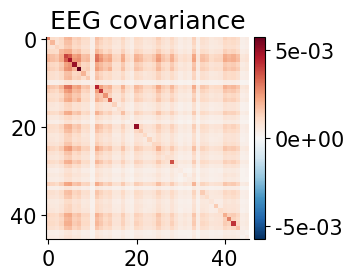

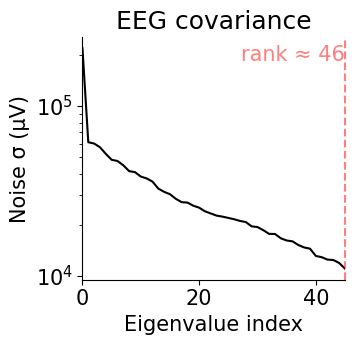

(<Figure size 380x370 with 2 Axes>, <Figure size 380x370 with 1 Axes>)

In [ ]:
cov = mne.compute_raw_covariance(sim_d1)
cov.plot(sim_d1.info)

In [ ]:
inv = mne.minimum_norm.make_inverse_operator(sim_d1.info, forward, noise_cov=cov)

Computing inverse operator with 46 channels.
    46 out of 46 channels remain after picking
Selected 46 channels
Creating the depth weighting matrix...
    46 EEG channels
    limit = 321/320 = 9.603166
    scale = 2.49732e+10 exp = 0.8
Whitening the forward solution.
Computing rank from covariance with rank=None
    Using tolerance 4.9e-06 (2.2e-16 eps * 46 dim * 4.8e+08  max singular value)
    Estimated rank (eeg): 46
    EEG: rank 46 computed from 46 data channels with 0 projectors
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing SVD of whitened and weighted lead field matrix.
    largest singular value = 4.44034
    scaling factor to adjust the trace = 2.25161e+16 (nchan = 46 nzero = 0)


<ipython-input-39-15794a61160b>:1: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  inv = mne.minimum_norm.make_inverse_operator(sim_d1.info, forward, noise_cov=cov)
<ipython-input-39-15794a61160b>:1: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  inv = mne.minimum_norm.make_inverse_operator(sim_d1.info, forward, noise_cov=cov)


In [ ]:
rereferenced_raw, ref_data = mne.set_eeg_reference(sim_epochs.load_data(), ref_channels='average', copy=True, projection=True)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.


In [ ]:
from mne.minimum_norm import (apply_inverse, apply_inverse_epochs,
                              read_inverse_operator)

method = "dSPM"

snr = 3.0
lambda2 = 1.0 / snr ** 2
evoked = rereferenced_raw.average()
stc = apply_inverse(evoked, inv, lambda2, method,
                    pick_ori="normal")

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 60
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 46 (0 small eigenvalues omitted)
    Computing noise-normalization factors (dSPM)...
[done]
Applying inverse operator to "0.50 × hand + 0.50 × tongue"...
    Picked 46 channels from the data
    Computing inverse...
    Eigenleads need to be weighted ...
    Computing residual...
    Explained  26.5% variance
    dSPM...
[done]


In [ ]:
src_pow = np.sum(stc.data ** 2, axis=1)
seed_vertno = stc.vertices[0][np.argmax(src_pow)]
seed_idx = np.searchsorted(stc.vertices[0], seed_vertno)

In [ ]:
pip install mne_connectivity

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 45.3 MB/s eta 0:00:00


In [ ]:
from mne_connectivity import seed_target_indices, spectral_connectivity_epochs

n_sources = stc.data.shape[0]
indices = seed_target_indices([seed_idx], np.arange(n_sources))

In [ ]:
snr = 1.0  # use lower SNR for single epochs
lambda2 = 1.0 / snr ** 2
stcs = apply_inverse_epochs(rereferenced_raw, inv, lambda2, method,
                            pick_ori="normal", return_generator=True)

In [ ]:
fmin = (8., 13.)
fmax = (13., 30.)
sfreq = sim_d1.info['sfreq']  # the sampling frequency

coh = spectral_connectivity_epochs(
    stcs, method='coh', mode='fourier', indices=indices,
    sfreq=sfreq, fmin=fmin, fmax=fmax, faverage=True, n_jobs=1)
freqs = coh.freqs

print('Frequencies in Hz over which coherence was averaged for alpha: ')
print(freqs[0])
print('Frequencies in Hz over which coherence was averaged for beta: ')
print(freqs[1])

Connectivity computation...
Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 1
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 46 (0 small eigenvalues omitted)
    Computing noise-normalization factors (dSPM)...
[done]
Picked 46 channels from the data
Computing inverse...
    Eigenleads need to be weighted ...
Processing epoch : 1 / 60
    computing connectivity for 320 connections
    using t=-1.500s..4.000s for estimation (5501 points)
    computing connectivity for the bands:
     band 1: 8.2Hz..12.9Hz (27 points)
     band 2: 13.1Hz..30.0Hz (94 points)
    connectivity scores will be averaged for each band
    using FFT with a Hanning window to estimate spectra
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1
Processing epoch : 2 / 60
    computing connectivity for epoch

In [ ]:
x = []
xn = np.array(x)
vtx = [stc.vertices[0], xn]

In [ ]:
vtx

[array([ 181,  182,  183,  190,  191,  192,  193,  194,  202,  203,  214,
         311,  312,  313,  314,  315,  322,  323,  324,  325,  326,  332,
         333,  334,  335,  336,  337,  338,  344,  345,  346,  347,  348,
         357,  444,  445,  446,  447,  454,  455,  456,  457,  458,  459,
         464,  465,  466,  467,  468,  469,  470,  475,  476,  477,  478,
         479,  480,  481,  486,  487,  488,  489,  490,  491,  492,  498,
         499,  500,  501,  502,  509,  513,  514,  586,  587,  588,  589,
         590,  596,  597,  598,  599,  600,  601,  602,  607,  608,  609,
         610,  611,  612,  613,  617,  618,  619,  620,  621,  622,  623,
         624,  625,  628,  629,  630,  631,  632,  633,  634,  635,  636,
         639,  640,  641,  642,  643,  644,  645,  646,  647,  651,  652,
         653,  654,  655,  656,  657,  662,  663,  667,  668,  729,  730,
         731,  732,  733,  739,  740,  741,  742,  743,  744,  745,  750,
         751,  752,  753,  754,  755, 

In [ ]:
!pip install pyvistaqt
!pip install ipyevents

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.6 MB/s eta 0:00:00


In [ ]:
import mne
mne.viz.set_3d_backend("notebook")

'notebook'

In [ ]:
tmin = np.mean(freqs[0])
tstep = np.mean(freqs[1]) - tmin
coh_stc = mne.SourceEstimate(
    coh.get_data(), vertices=vtx, tmin=1e-3 * tmin,
    tstep=1e-3 * tstep, subject='sample')

# Now we can visualize the coherence using the plot method.
brain = coh_stc.plot('sample', 'inflated', 'both',
                     time_label='Coherence %0.1f Hz',
                     subjects_dir=subjects_dir,
                     clim=dict(kind='value', lims=(0.25, 0.4, 0.65)))
brain.show_view('lateral')

RuntimeError: ignored

In [ ]:
pip install vtk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 MB 10.7 MB/s eta 0:00:00
